!DEBIAN_FRONTEND=noninteractive apt-get --assume-yes install cuda-11-8

In [1]:
!pip uninstall -y tensorflow keras
!pip install tensorflow==2.15.0 keras==2.15.0

Found existing installation: tensorflow 2.15.0
Uninstalling tensorflow-2.15.0:
  Successfully uninstalled tensorflow-2.15.0
Found existing installation: keras 2.15.0
Uninstalling keras-2.15.0:
  Successfully uninstalled keras-2.15.0
  Using cached tensorflow-2.15.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.4 kB)
  Using cached keras-2.15.0-py3-none-any.whl.metadata (2.4 kB)
Using cached tensorflow-2.15.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (475.2 MB)
Using cached keras-2.15.0-py3-none-any.whl (1.7 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.15.0 which is incompatible.
tensorflow-serving-api 2.16.1 requires tensorflow<3,>=2.16.1, but you have tensorflow 2.15.0 which is incompatible.
tensorflow-text 2.16.1 requires t

In [2]:
import os
import time
import random

from glob import glob
from PIL import Image
from IPython import display
from matplotlib import pyplot as plt

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import numpy as np

2024-09-06 05:53:36.700430: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-06 05:53:36.700515: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-06 05:53:36.702436: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
import shutil
if os.path.exists('/kaggle/working/Model'):
    shutil.rmtree('/kaggle/working/Model')

In [4]:
print(tf.config.list_physical_devices('GPU'))
print(tf.test.gpu_device_name())

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
/device:GPU:0


In [5]:
decom = 1
batch_size = 32
patch_size = 48
epoch = 30
eval_every_epoch = 1
start_lr = 0.0003

dataset_path = '/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak'
ckpt_path = '/kaggle/working/Model/Model_Data/ckpt'
test_path = f'{dataset_path}'
save_test_path = '/kaggle/working/Model/Model_Data/save'

### Utils

In [6]:
def load_images(file):
    im = Image.open(file)
    return np.array(im, dtype="float32") / 255.0

In [7]:
def save_images(filepath, result_1):
    result = np.squeeze(result_1)

    im = Image.fromarray(np.clip(result * 255.0, 0, 255.0).astype('uint8'))
    im.save(filepath, format='png')
    print(f'[*] Saved at {filepath}')

### Model Building

In [8]:
def DecomNet(input_im, layer_num, channel=64, kernel_size=3):
    input_max = tf.reduce_max(input_im, axis=3, keepdims=True)
    input_im = concat([input_max, input_im])
    with tf.variable_scope('DecomNet', reuse=tf.AUTO_REUSE):
        conv = tf.layers.conv2d(input_im, channel, kernel_size * 3, padding='same', activation=None, name="shallow_feature_extraction")
        for idx in range(layer_num):
            conv = tf.layers.conv2d(conv, channel, kernel_size, padding='same', activation=tf.nn.relu, name=f'activated_layer_{idx}')
        conv = tf.layers.conv2d(conv, 4, kernel_size, padding='same', activation=None, name='recon_layer')

    R = tf.sigmoid(conv[:,:,:,0:3])
    L = tf.sigmoid(conv[:,:,:,3:4])

    return R, L

def RelightNet(input_L, input_R, channel=64, kernel_size=3):
    input_im = concat([input_R, input_L])
    with tf.variable_scope('RelightNet', reuse=tf.AUTO_REUSE):
        conv0 = tf.layers.conv2d(input_im, channel, kernel_size, padding='same', activation=None)
        conv1 = tf.layers.conv2d(conv0, channel, kernel_size, strides=2, padding='same', activation=tf.nn.relu)
        conv2 = tf.layers.conv2d(conv1, channel, kernel_size, strides=2, padding='same', activation=tf.nn.relu)
        conv3 = tf.layers.conv2d(conv2, channel, kernel_size, strides=2, padding='same', activation=tf.nn.relu)
        
        up1 = tf.image.resize_nearest_neighbor(conv3, (tf.shape(conv2)[1], tf.shape(conv2)[2]))
        deconv1 = tf.layers.conv2d(up1, channel, kernel_size, padding='same', activation=tf.nn.relu) + conv2
        up2 = tf.image.resize_nearest_neighbor(deconv1, (tf.shape(conv1)[1], tf.shape(conv1)[2]))
        deconv2= tf.layers.conv2d(up2, channel, kernel_size, padding='same', activation=tf.nn.relu) + conv1
        up3 = tf.image.resize_nearest_neighbor(deconv2, (tf.shape(conv0)[1], tf.shape(conv0)[2]))
        deconv3 = tf.layers.conv2d(up3, channel, kernel_size, padding='same', activation=tf.nn.relu) + conv0
        
        deconv1_resize = tf.image.resize_nearest_neighbor(deconv1, (tf.shape(deconv3)[1], tf.shape(deconv3)[2]))
        deconv2_resize = tf.image.resize_nearest_neighbor(deconv2, (tf.shape(deconv3)[1], tf.shape(deconv3)[2]))
        feature_gather = concat([deconv1_resize, deconv2_resize, deconv3])
        feature_fusion = tf.layers.conv2d(feature_gather, channel, 1, padding='same', activation=None)
        output = tf.layers.conv2d(feature_fusion, 1, 3, padding='same', activation=None)
    return output

In [9]:
def concat(layers):
    return tf.concat(layers, axis=3)

In [10]:
def data_augmentation(image, mode):
    match mode:
        case 0:
            return image
        case 1:
            return np.flipud(image)
        case 2:
            return np.rot90(image)
        case 3:
            image = np.rot90(image)
            return np.flipud(image)
        case 4:
            return np.rot90(image, k=2)
        case 5:
            image = np.rot90(image, k=2)
            return np.flipud(image)
        case 6:
            return np.rot90(image, k=3)
        case 7:
            image = np.rot90(image, k=3)
            return np.flipud(image)

In [18]:
class lowlight_enhance:
    def __init__(self, sess):
        self.sess = sess
        self.DecomNet_layer_num = 5

        self.input_low = tf.placeholder(tf.float32, [None, None, None, 3], name='input_low')
        self.input_high = tf.placeholder(tf.float32, [None, None, None, 3], name='input_high')

        [R_low, I_low] = DecomNet(self.input_low, layer_num=self.DecomNet_layer_num)
        [R_high, I_high] = DecomNet(self.input_high, layer_num=self.DecomNet_layer_num)
        
        I_delta = RelightNet(I_low, R_low)

        I_low_3 = concat([I_low, I_low, I_low])
        I_high_3 = concat([I_high, I_high, I_high])
        I_delta_3 = concat([I_delta, I_delta, I_delta])

        self.output_R_low = R_low
        self.output_I_low = I_low_3
        self.output_I_delta = I_delta_3
        self.output_S = R_low * I_delta_3

        self.recon_loss_low = tf.reduce_mean(tf.abs(R_low * I_low_3 -  self.input_low))
        self.recon_loss_high = tf.reduce_mean(tf.abs(R_high * I_high_3 - self.input_high))
        self.recon_loss_mutal_low = tf.reduce_mean(tf.abs(R_high * I_low_3 - self.input_low))
        self.recon_loss_mutal_high = tf.reduce_mean(tf.abs(R_low * I_high_3 - self.input_high))
        self.equal_R_loss = tf.reduce_mean(tf.abs(R_low - R_high))
        self.relight_loss = tf.reduce_mean(tf.abs(R_low * I_delta_3 - self.input_high))

        self.Ismooth_loss_low = self.smooth(I_low, R_low)
        self.Ismooth_loss_high = self.smooth(I_high, R_high)
        self.Ismooth_loss_delta = self.smooth(I_delta, R_low)

        self.loss_Decom = self.recon_loss_low + self.recon_loss_high + 0.001 * self.recon_loss_mutal_low + 0.001 * self.recon_loss_mutal_high + 0.1 * self.Ismooth_loss_low + 0.1 * self.Ismooth_loss_high + 0.01 * self.equal_R_loss
        self.loss_Relight = self.relight_loss + 3 * self.Ismooth_loss_delta

        self.lr = tf.placeholder(tf.float32, name='learning_rate')
        optimizer = tf.train.AdamOptimizer(self.lr, name='AdamOptimizer')

        self.var_Decom = [var for var in tf.trainable_variables() if 'DecomNet' in var.name]
        self.var_Relight = [var for var in tf.trainable_variables() if 'RelightNet' in var.name]

        self.train_op_Decom = optimizer.minimize(self.loss_Decom, var_list = self.var_Decom)
        self.train_op_Relight = optimizer.minimize(self.loss_Relight, var_list = self.var_Relight)

        self.sess.run(tf.global_variables_initializer())

        self.saver_Decom = tf.train.Saver(var_list = self.var_Decom)
        self.saver_Relight = tf.train.Saver(var_list = self.var_Relight)

        print("[*] Initialize model successfully...")

    def gradient(self, input_tensor, direction):
        self.smooth_kernel_x = tf.reshape(tf.constant([[0, 0], [-1, 1]], tf.float32), [2, 2, 1, 1])
        self.smooth_kernel_y = tf.transpose(self.smooth_kernel_x, [1, 0, 2, 3])

        if direction == "x":
            kernel = self.smooth_kernel_x
        elif direction == "y":
            kernel = self.smooth_kernel_y
        return tf.abs(tf.nn.conv2d(input_tensor, kernel, strides=[1, 1, 1, 1], padding='SAME'))

    def ave_gradient(self, input_tensor, direction):
        return tf.layers.average_pooling2d(self.gradient(input_tensor, direction), pool_size=3, strides=1, padding='SAME')

    def smooth(self, input_I, input_R):
        input_R = tf.image.rgb_to_grayscale(input_R)
        return tf.reduce_mean(self.gradient(input_I, "x") * tf.exp(-10 * self.ave_gradient(input_R, "x")) + self.gradient(input_I, "y") * tf.exp(-10 * self.ave_gradient(input_R, "y")))

    def evaluate_generate_image(self, epoch_num, eval_low_data, eval_high_data, train_phase, result_1, result_2, values):
        result_1 = np.squeeze(result_1)
        result_2 = np.squeeze(result_2)
        
        result_com = np.clip(result_1 * result_2, 0, 1)
        
        result_1 = np.clip(result_1, 0.0, 1.0)
        result_2 = np.clip(result_2, 0.0, 1.0)
        
        plt.figure(figsize=(15, 15))
        display_list = [eval_low_data, eval_high_data, result_1, result_2, result_com]
        title = ['Input', 'Ground Truth'] + values + ['Combined']
        
        for i in range(len(title)):
            plt.subplot(1, len(title), i+1)
            plt.title(title[i])
            plt.imshow(display_list[i])
            plt.axis('off')
        plt.show()
    
    def evaluate(self, epoch_num, eval_low_data, train_phase, eval_high_data):
        print(f"[*] Evaluating for phase {train_phase} / epoch {epoch_num}...")

        for idx in range(len(eval_low_data)):
            input_low_eval = np.expand_dims(eval_low_data[idx], axis=0)

            if train_phase == "Decom":
                result_1, result_2 = self.sess.run([self.output_R_low, self.output_I_low], feed_dict={self.input_low: input_low_eval})
                values = ['Reflectance_Low', 'Illumination_Low']
            if train_phase == "Relight":
                result_1, result_2 = self.sess.run([self.output_S, self.output_I_delta], feed_dict={self.input_low: input_low_eval})
                values = ['Sample', 'Illumination_Delta']
            
            self.evaluate_generate_image(epoch_num, eval_low_data[idx], eval_high_data[idx], train_phase, result_1, result_2, values)

    def train(self, train_low_data, train_high_data, eval_low_data, batch_size, patch_size, epoch, lr, ckpt_dir, eval_every_epoch, train_phase, eval_high_data):
        assert len(train_low_data) == len(train_high_data)
        numBatch = len(train_low_data) // int(batch_size)

        if train_phase == "Decom":
            train_op = self.train_op_Decom
            train_loss = self.loss_Decom
            saver = self.saver_Decom
        elif train_phase == "Relight":
            train_op = self.train_op_Relight
            train_loss = self.loss_Relight
            saver = self.saver_Relight

        load_model_status, global_step = self.load(saver, ckpt_dir)
        if load_model_status:
            iter_num = global_step
            start_epoch = global_step // numBatch
            start_step = global_step % numBatch
            print("[*] Model restore success!")
        else:
            iter_num = 0
            start_epoch = 0
            start_step = 0
            print("[*] No pretrained model found!")

        print(f"[*] Start training for phase {train_phase}, with start epoch {start_epoch} start iter {iter_num} : ")

        start_time = time.time()
        image_id = 0

        for epoch in range(start_epoch, epoch):
            epoch_time = time.time()
            for batch_id in range(start_step, numBatch):
                batch_input_low = np.zeros((batch_size, patch_size, patch_size, 3), dtype="float32")
                batch_input_high = np.zeros((batch_size, patch_size, patch_size, 3), dtype="float32")
                for patch_id in range(batch_size):
                    h, w, _ = train_low_data[image_id].shape
                    x = random.randint(0, h - patch_size)
                    y = random.randint(0, w - patch_size)
            
                    rand_mode = random.randint(0, 7)
                    batch_input_low[patch_id, :, :, :] = data_augmentation(train_low_data[image_id][x : x+patch_size, y : y+patch_size, :], rand_mode)
                    batch_input_high[patch_id, :, :, :] = data_augmentation(train_high_data[image_id][x : x+patch_size, y : y+patch_size, :], rand_mode)
                    
                    image_id = (image_id + 1) % len(train_low_data)
                    if image_id == 0:
                        tmp = list(zip(train_low_data, train_high_data))
                        random.shuffle(list(tmp))
                        train_low_data, train_high_data  = zip(*tmp)

                _, loss = self.sess.run([train_op, train_loss], feed_dict={self.input_low: batch_input_low, 
                                                                           self.input_high: batch_input_high, 
                                                                           self.lr: lr[epoch]})

                print(f"{train_phase} Epoch: [{(epoch + 1):2d}] [{(batch_id + 1):4d}/{numBatch:4d}] time: {time.time() - epoch_time:4.4f}, loss: {loss:.6f}", end='\r')
                iter_num += 1
            print()
            if (epoch + 1) % eval_every_epoch == 0:
                self.evaluate(epoch + 1, eval_low_data, train_phase, eval_high_data)
                self.save(saver, iter_num, ckpt_dir, f"RetinexNet-{train_phase}")

        print(f"[*] Finish training for phase {train_phase} in time {time.time() - start_time:4.4f}.")

    def save(self, saver, iter_num, ckpt_dir, model_name):
        if not os.path.exists(ckpt_dir):
            os.makedirs(ckpt_dir)
        print(f"[*] Saving model {model_name}")
        saver.save(self.sess, os.path.join(ckpt_dir, model_name), global_step=iter_num)

    def load(self, saver, ckpt_dir):
        ckpt = tf.train.get_checkpoint_state(ckpt_dir)
        if ckpt and ckpt.model_checkpoint_path:
            full_path = tf.train.latest_checkpoint(ckpt_dir)
            try:
                global_step = int(full_path.split('/')[-1].split('-')[-1])
            except ValueError:
                global_step = None
            saver.restore(self.sess, full_path)
            return True, global_step
        else:
            print(f"[*] Failed to load model from {ckpt_dir}")
            return False, 0

    def test(self, test_low_data, test_high_data, test_low_data_names, save_dir, decom_flag):
        tf.global_variables_initializer().run()

        print("[*] Reading checkpoint...")
        load_model_status_Decom, _ = self.load(self.saver_Decom, ckpt_path + '/Decom')
        load_model_status_Relight, _ = self.load(self.saver_Relight, ckpt_path + '/Relight')
        if load_model_status_Decom and load_model_status_Relight:
            print("[*] Load weights successfully...")
        
        print("[*] Testing...")
        for idx in range(len(test_low_data)):
            print(test_low_data_names[idx])
            [_, name] = os.path.split(test_low_data_names[idx])
            suffix = name[name.find('.') + 1:]
            name = name[:name.find('.')]

            input_low_test = np.expand_dims(test_low_data[idx], axis=0)
            [R_low, I_low, I_delta, S] = self.sess.run([self.output_R_low, self.output_I_low, self.output_I_delta, self.output_S], feed_dict = {self.input_low: input_low_test})

            if decom_flag == 1:
                save_images(os.path.join(save_dir, name + "_R_low." + suffix), R_low)
                save_images(os.path.join(save_dir, name + "_I_low." + suffix), I_low)
                save_images(os.path.join(save_dir, name + "_I_delta." + suffix), I_delta)
            save_images(os.path.join(save_dir, name + "_S."   + suffix), S)
            save_images(os.path.join(save_dir, name + "_Result." + suffix), [np.squeeze(S) * np.squeeze(I_delta)])
            
            plt.figure(figsize=(15, 15))
            title = ['Input', 'Ground Truth', 'Sample', 'Illumination', 'Result']
            display_list = [test_low_data[idx], test_high_data[idx], np.squeeze(S), np.squeeze(I_delta), np.clip(np.squeeze(I_delta), 0, 1)]
            
            for i in range(len(title)):
                plt.subplot(1, len(title), i+1)
                plt.title(title[i])
                plt.imshow(display_list[i])
                plt.axis('off')
            plt.show()

### Model Training

In [12]:
def lowlight_train(lowlight_enhance):
    if not os.path.exists(ckpt_path):
        os.makedirs(ckpt_path)

    lr = start_lr * np.ones([epoch])
    lr[20:] = lr[0] / 10.0

    train_low_data = []
    train_high_data = []

    train_low_data_names = glob(f'{dataset_path}/Kaggle-8000-Original-Darkened/images/*.png')
    train_low_data_names.sort()
    train_high_data_names = glob(f'{dataset_path}/Kaggle-8000-Original/images/*.png')
    train_high_data_names.sort()
    
    print(f'[*] Number of training data: {len(train_low_data_names)}')

    for idx in range(200, 4000):
        low_im = load_images(train_low_data_names[idx])
        train_low_data.append(low_im)
        high_im = load_images(train_high_data_names[idx])
        train_high_data.append(high_im)

    eval_low_data = []
    eval_high_data = []

    eval_low_data_name = glob(f'{dataset_path}/Kaggle-8000-Original-Darkened/images/*.*')

    for idx in range(10, 200):
        eval_low_im = load_images(eval_low_data_name[idx])
        eval_low_data.append(eval_low_im)
        break
        
    eval_high_data_name = glob(f'{dataset_path}/Kaggle-8000-Original/images/*.*')

    for idx in range(10, 200):
        eval_high_im = load_images(eval_high_data_name[idx])
        eval_high_data.append(eval_high_im)
        break

    lowlight_enhance.train(train_low_data, train_high_data, eval_low_data, batch_size=batch_size, patch_size=patch_size, epoch=epoch, lr=lr, ckpt_dir=os.path.join(ckpt_path, 'Decom'), eval_every_epoch=eval_every_epoch, train_phase="Decom", eval_high_data=eval_high_data)
    lowlight_enhance.train(train_low_data, train_high_data, eval_low_data, batch_size=batch_size, patch_size=patch_size, epoch=epoch, lr=lr, ckpt_dir=os.path.join(ckpt_path, 'Relight'), eval_every_epoch=eval_every_epoch, train_phase="Relight", eval_high_data=eval_high_data)

/tmp/ipykernel_2291/1021350135.py:5: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(input_im, channel, kernel_size * 3, padding='same', activation=None, name="shallow_feature_extraction")
/tmp/ipykernel_2291/1021350135.py:7: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(conv, channel, kernel_size, padding='same', activation=tf.nn.relu, name=f'activated_layer_{idx}')
/tmp/ipykernel_2291/1021350135.py:8: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(conv, 4, kernel_size, padding='same', activation=None, name='recon_layer')
/tmp/ipykernel_2291/1021350135.py:18: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `t

[*] Initialize model successfully...
[*] Number of training data: 8756
[*] Failed to load model from /kaggle/working/Model/Model_Data/ckpt/Decom
[*] No pretrained model found!
[*] Start training for phase Decom, with start epoch 0 start iter 0 : 
Decom Epoch: [ 1] [ 118/ 118] time: 5.8827, loss: 0.064131
[*] Evaluating for phase Decom / epoch 1...


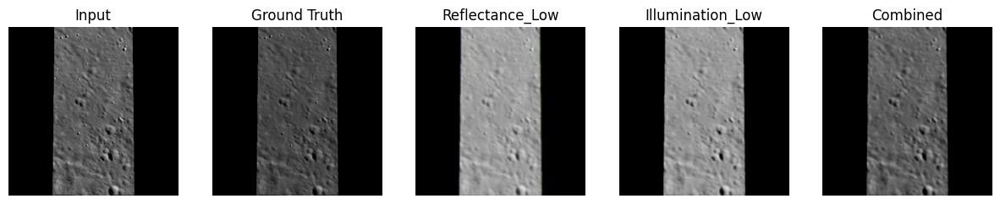

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 2] [ 118/ 118] time: 3.9777, loss: 0.023275
[*] Evaluating for phase Decom / epoch 2...


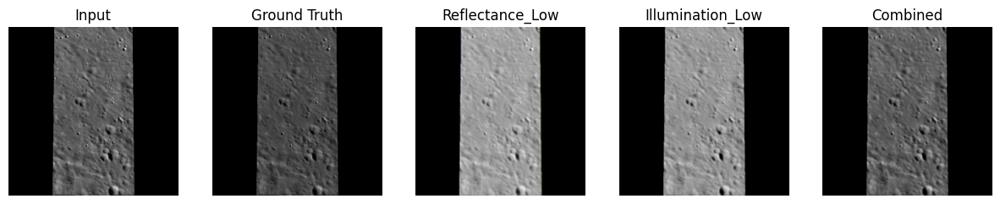

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 3] [ 118/ 118] time: 3.9883, loss: 0.024178
[*] Evaluating for phase Decom / epoch 3...


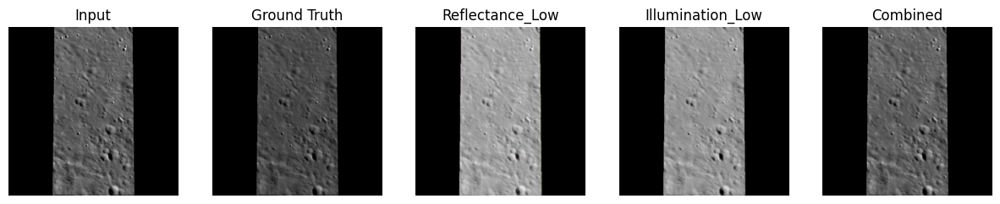

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 4] [ 118/ 118] time: 3.9725, loss: 0.020043
[*] Evaluating for phase Decom / epoch 4...


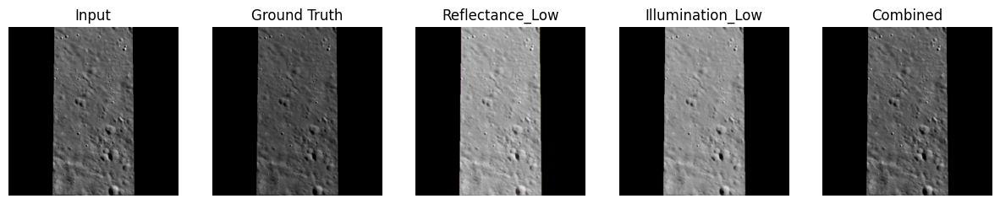

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 5] [ 118/ 118] time: 3.9850, loss: 0.017903
[*] Evaluating for phase Decom / epoch 5...


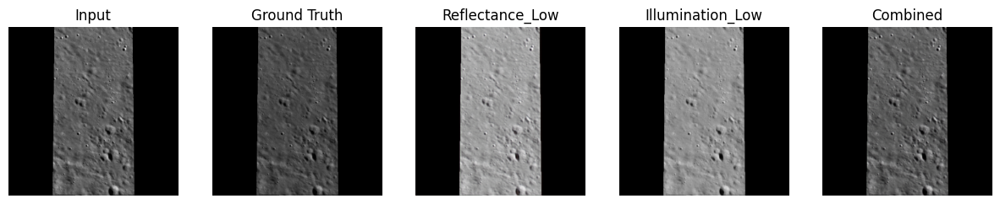

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 6] [ 118/ 118] time: 4.0210, loss: 0.017386
[*] Evaluating for phase Decom / epoch 6...


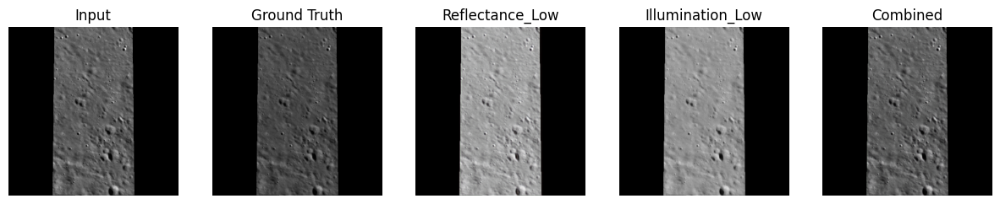

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 7] [ 118/ 118] time: 3.9609, loss: 0.016158
[*] Evaluating for phase Decom / epoch 7...


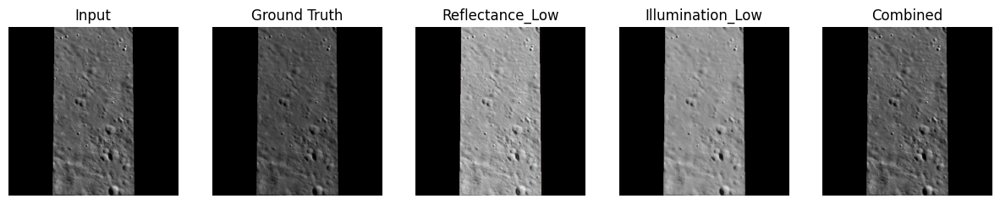

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 8] [ 118/ 118] time: 3.9973, loss: 0.013469
[*] Evaluating for phase Decom / epoch 8...


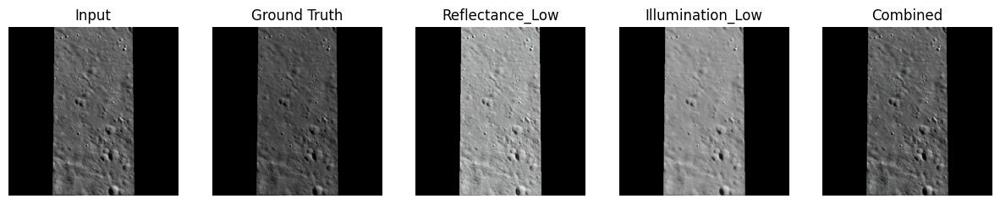

[*] Saving model RetinexNet-Decom
Decom Epoch: [ 9] [ 118/ 118] time: 3.9625, loss: 0.011731
[*] Evaluating for phase Decom / epoch 9...


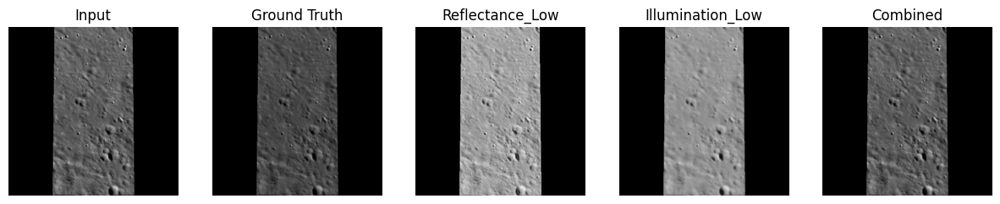

[*] Saving model RetinexNet-Decom
Decom Epoch: [10] [ 118/ 118] time: 3.9606, loss: 0.013878
[*] Evaluating for phase Decom / epoch 10...


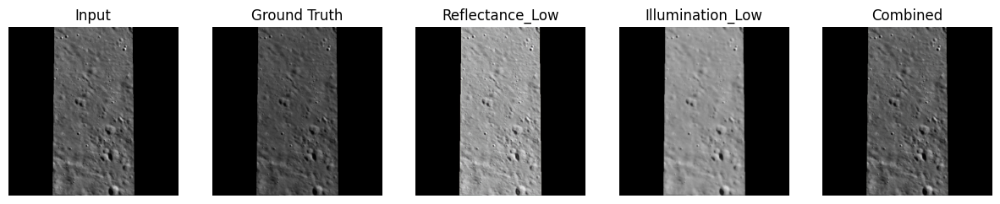

[*] Saving model RetinexNet-Decom
Decom Epoch: [11] [ 118/ 118] time: 4.0535, loss: 0.010224
[*] Evaluating for phase Decom / epoch 11...


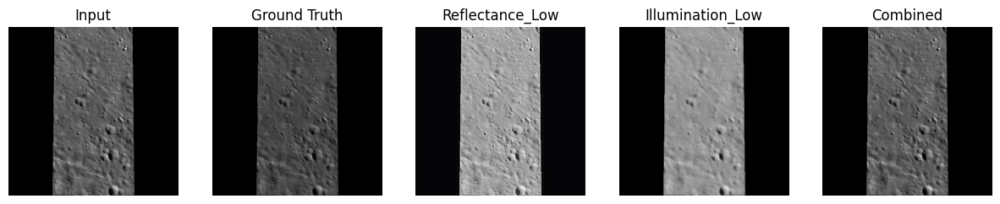

[*] Saving model RetinexNet-Decom
Decom Epoch: [12] [ 118/ 118] time: 3.9704, loss: 0.009459
[*] Evaluating for phase Decom / epoch 12...


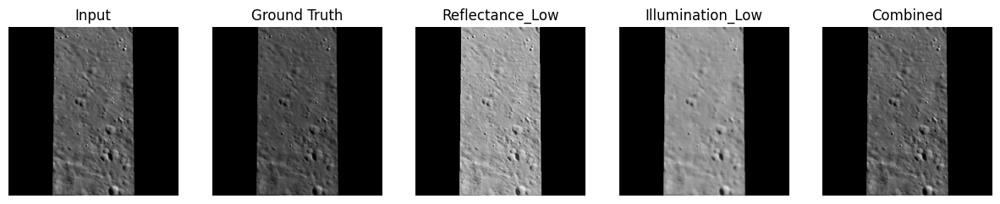

[*] Saving model RetinexNet-Decom
Decom Epoch: [13] [ 118/ 118] time: 4.0138, loss: 0.012759
[*] Evaluating for phase Decom / epoch 13...


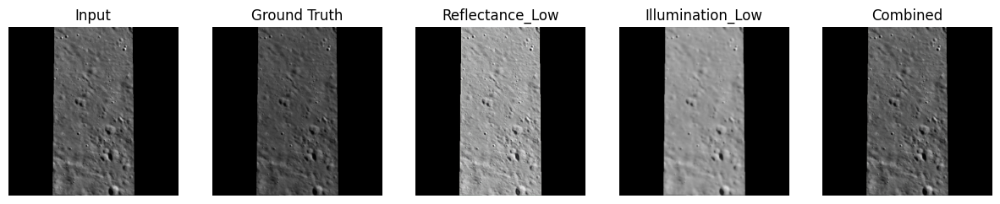

[*] Saving model RetinexNet-Decom
Decom Epoch: [14] [ 118/ 118] time: 3.9283, loss: 0.011195
[*] Evaluating for phase Decom / epoch 14...


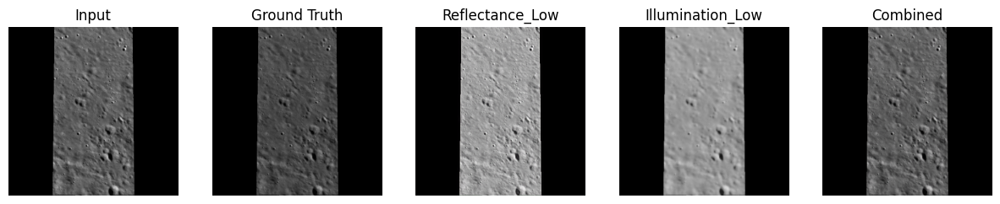

[*] Saving model RetinexNet-Decom
Decom Epoch: [15] [ 118/ 118] time: 3.9438, loss: 0.010628
[*] Evaluating for phase Decom / epoch 15...


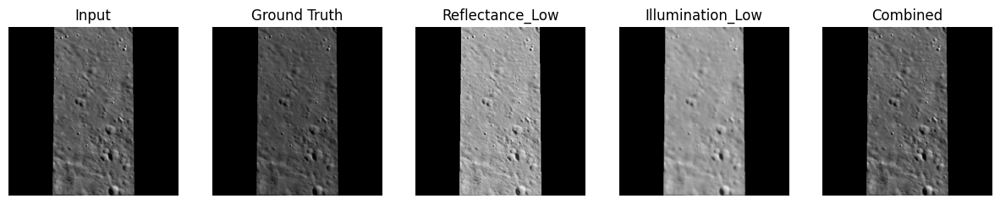

[*] Saving model RetinexNet-Decom
Decom Epoch: [16] [ 118/ 118] time: 3.9672, loss: 0.022730
[*] Evaluating for phase Decom / epoch 16...


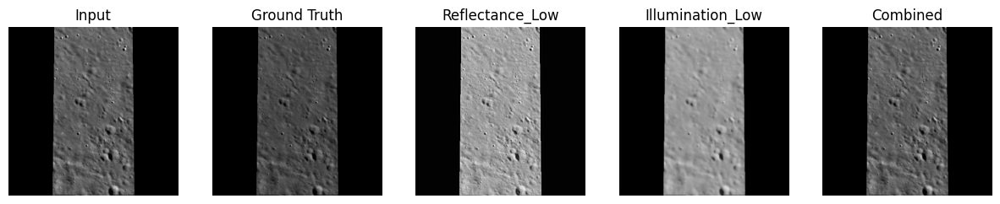

[*] Saving model RetinexNet-Decom
Decom Epoch: [17] [ 118/ 118] time: 3.9198, loss: 0.006819
[*] Evaluating for phase Decom / epoch 17...


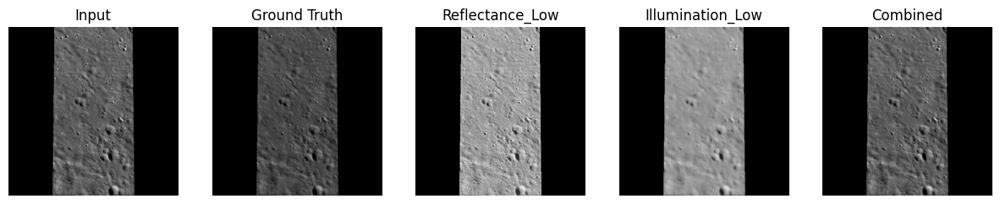

[*] Saving model RetinexNet-Decom
Decom Epoch: [18] [ 118/ 118] time: 3.8768, loss: 0.007849
[*] Evaluating for phase Decom / epoch 18...


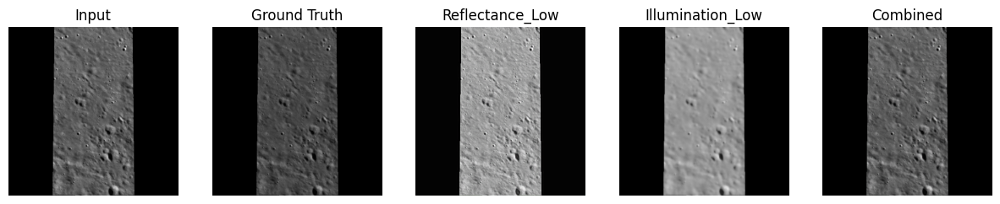

[*] Saving model RetinexNet-Decom
Decom Epoch: [19] [ 118/ 118] time: 3.9411, loss: 0.007068
[*] Evaluating for phase Decom / epoch 19...


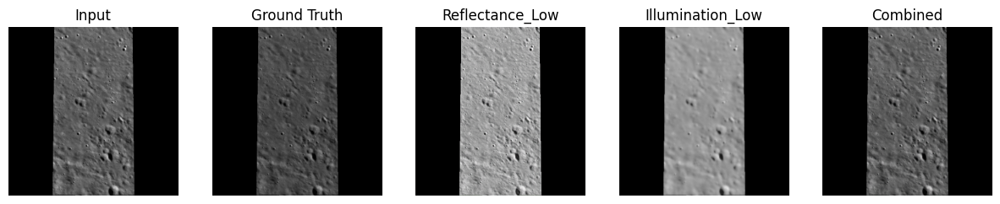

[*] Saving model RetinexNet-Decom
Decom Epoch: [20] [ 118/ 118] time: 3.9819, loss: 0.014792
[*] Evaluating for phase Decom / epoch 20...


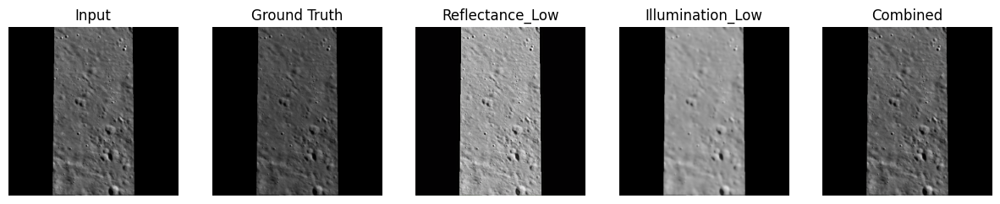

[*] Saving model RetinexNet-Decom
Decom Epoch: [21] [ 118/ 118] time: 3.9618, loss: 0.008234
[*] Evaluating for phase Decom / epoch 21...


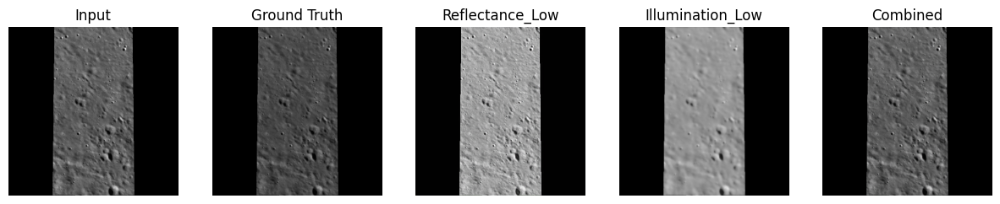

[*] Saving model RetinexNet-Decom
Decom Epoch: [22] [ 118/ 118] time: 3.9595, loss: 0.006514
[*] Evaluating for phase Decom / epoch 22...


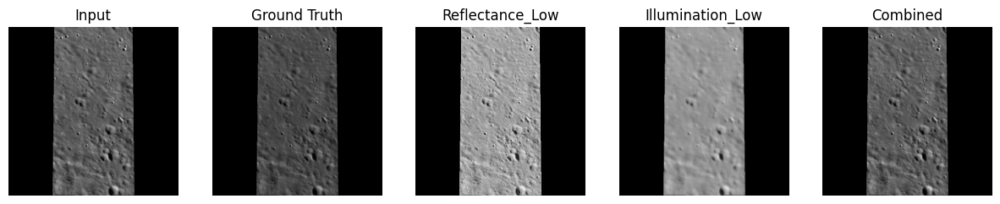

[*] Saving model RetinexNet-Decom
Decom Epoch: [23] [ 118/ 118] time: 3.9624, loss: 0.004939
[*] Evaluating for phase Decom / epoch 23...


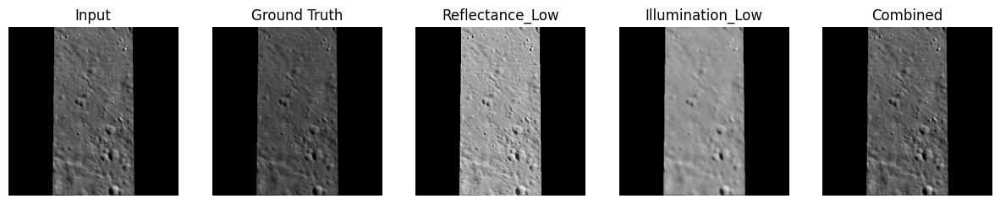

[*] Saving model RetinexNet-Decom
Decom Epoch: [24] [ 118/ 118] time: 3.9721, loss: 0.005203
[*] Evaluating for phase Decom / epoch 24...


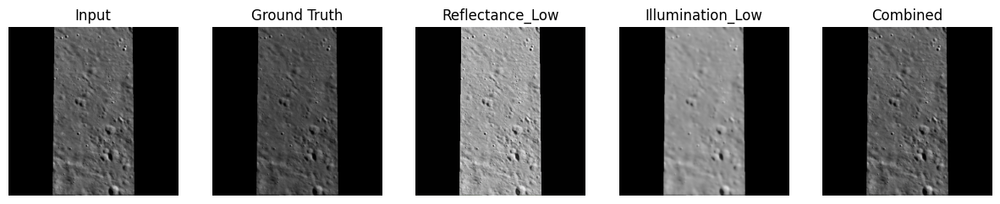

[*] Saving model RetinexNet-Decom
Decom Epoch: [25] [ 118/ 118] time: 3.9675, loss: 0.006509
[*] Evaluating for phase Decom / epoch 25...


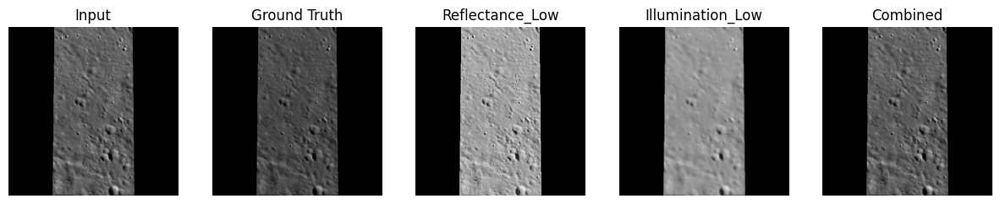

[*] Saving model RetinexNet-Decom
Decom Epoch: [26] [ 118/ 118] time: 4.0160, loss: 0.004882
[*] Evaluating for phase Decom / epoch 26...


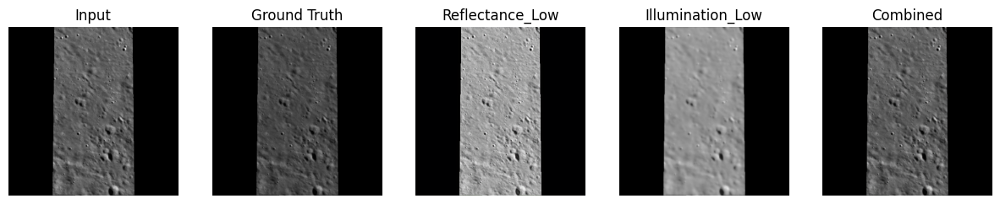

[*] Saving model RetinexNet-Decom
Decom Epoch: [27] [ 118/ 118] time: 3.9461, loss: 0.005491
[*] Evaluating for phase Decom / epoch 27...


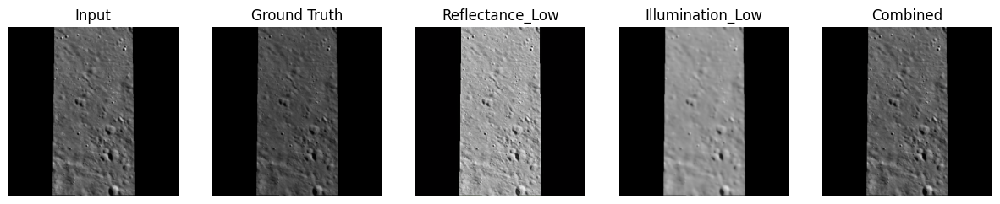

[*] Saving model RetinexNet-Decom
Decom Epoch: [28] [ 118/ 118] time: 3.9451, loss: 0.004038
[*] Evaluating for phase Decom / epoch 28...


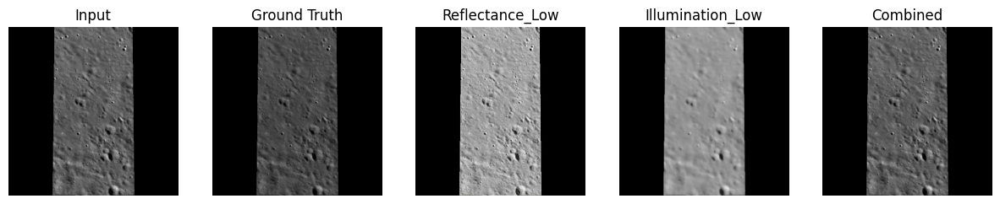

[*] Saving model RetinexNet-Decom
Decom Epoch: [29] [ 118/ 118] time: 3.9640, loss: 0.005489
[*] Evaluating for phase Decom / epoch 29...


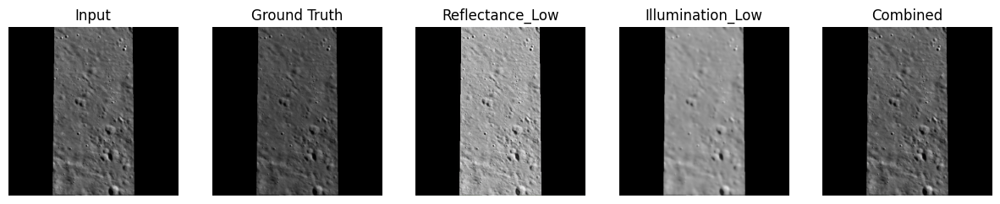

[*] Saving model RetinexNet-Decom
Decom Epoch: [30] [ 118/ 118] time: 4.0204, loss: 0.005092
[*] Evaluating for phase Decom / epoch 30...


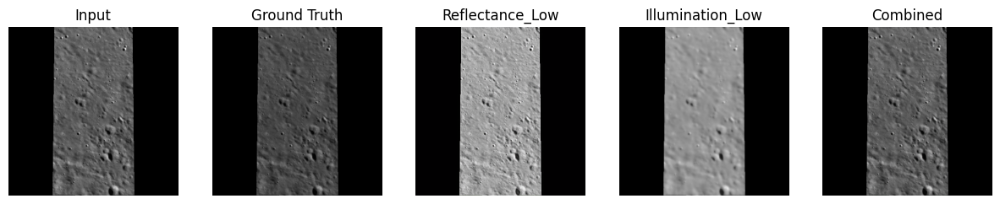

[*] Saving model RetinexNet-Decom
[*] Finish training for phase Decom in time 143.4351.
[*] Failed to load model from /kaggle/working/Model/Model_Data/ckpt/Relight
[*] No pretrained model found!
[*] Start training for phase Relight, with start epoch 0 start iter 0 : 
Relight Epoch: [ 1] [ 118/ 118] time: 3.3819, loss: 0.018777
[*] Evaluating for phase Relight / epoch 1...


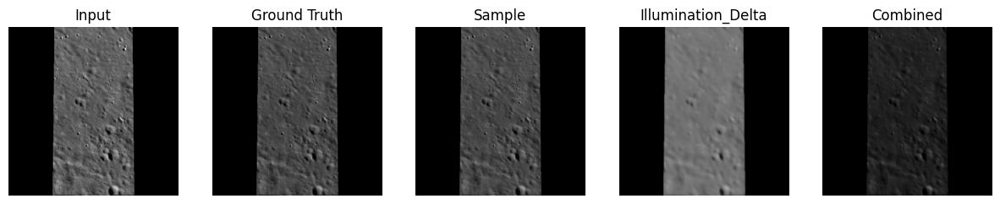

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 2] [ 118/ 118] time: 2.3987, loss: 0.015669
[*] Evaluating for phase Relight / epoch 2...


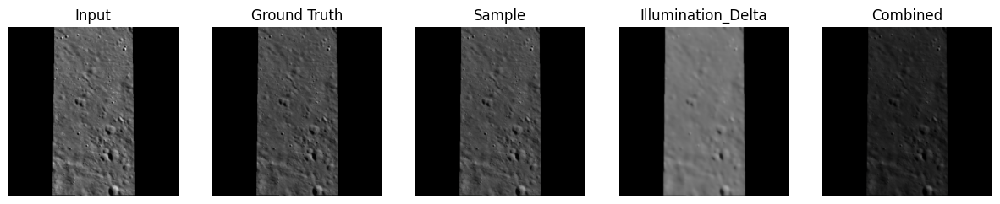

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 3] [ 118/ 118] time: 2.4192, loss: 0.022045
[*] Evaluating for phase Relight / epoch 3...


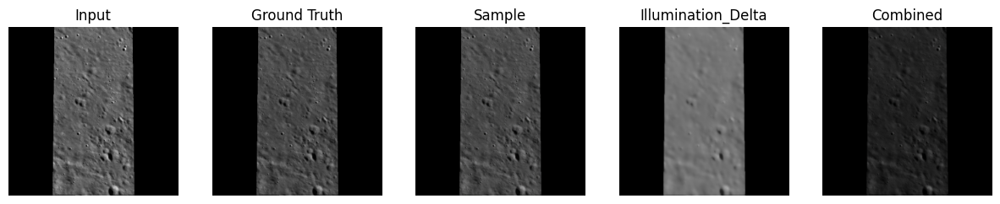

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 4] [ 118/ 118] time: 2.7750, loss: 0.016460
[*] Evaluating for phase Relight / epoch 4...


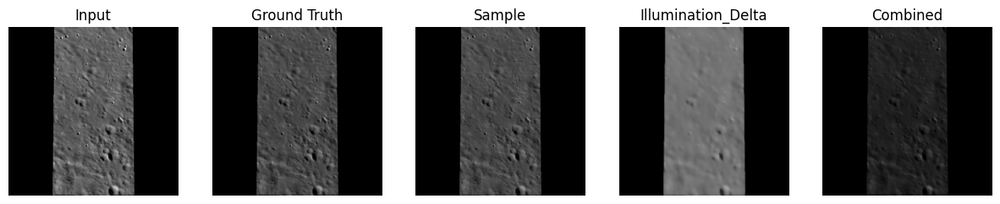

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 5] [ 118/ 118] time: 2.4335, loss: 0.015355
[*] Evaluating for phase Relight / epoch 5...


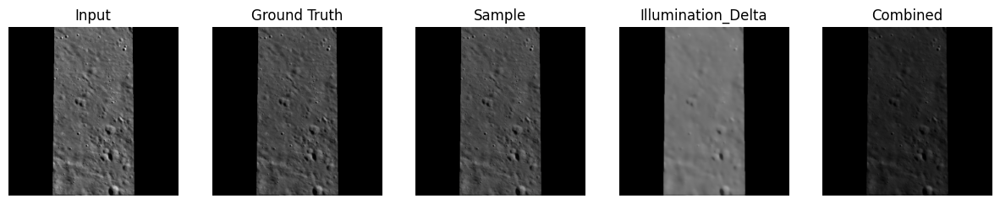

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 6] [ 118/ 118] time: 2.4327, loss: 0.012677
[*] Evaluating for phase Relight / epoch 6...


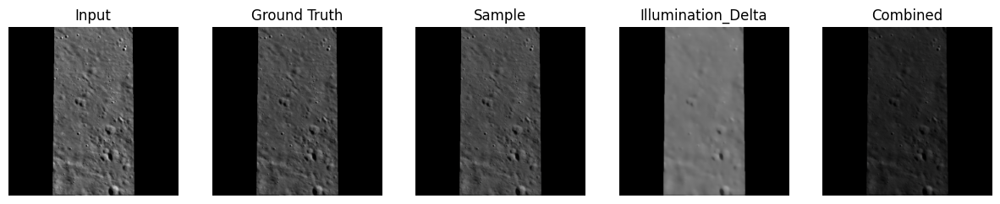

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 7] [ 118/ 118] time: 2.4438, loss: 0.014929
[*] Evaluating for phase Relight / epoch 7...


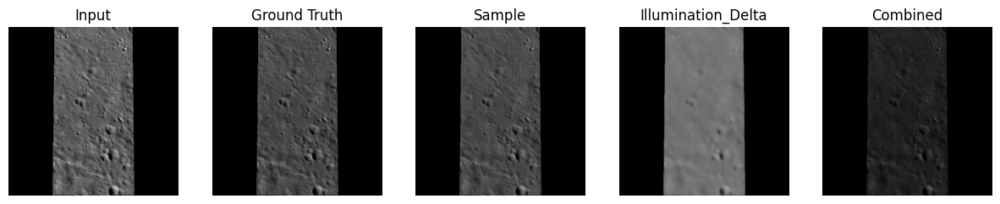

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 8] [ 118/ 118] time: 2.4450, loss: 0.011452
[*] Evaluating for phase Relight / epoch 8...


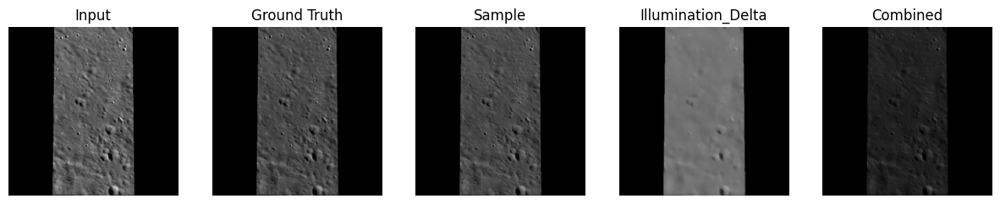

[*] Saving model RetinexNet-Relight
Relight Epoch: [ 9] [ 118/ 118] time: 2.4600, loss: 0.013477
[*] Evaluating for phase Relight / epoch 9...


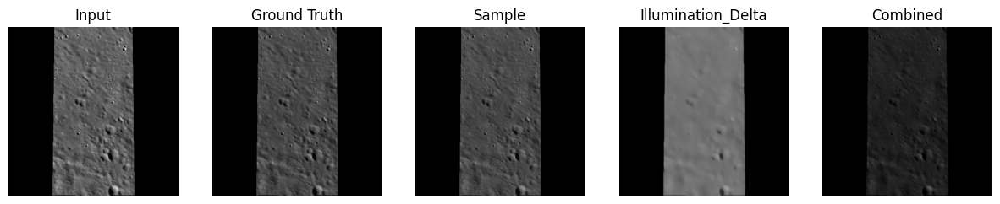

[*] Saving model RetinexNet-Relight
Relight Epoch: [10] [ 118/ 118] time: 2.4321, loss: 0.012028
[*] Evaluating for phase Relight / epoch 10...


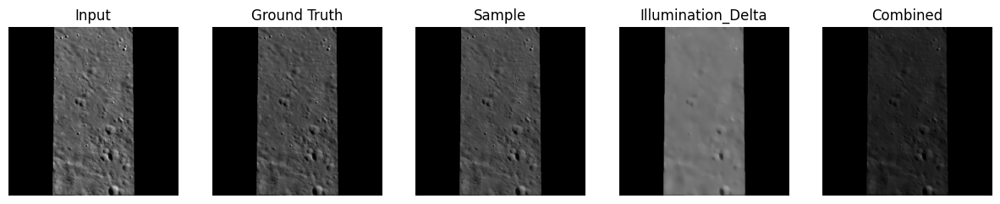

[*] Saving model RetinexNet-Relight
Relight Epoch: [11] [ 118/ 118] time: 2.4484, loss: 0.013085
[*] Evaluating for phase Relight / epoch 11...


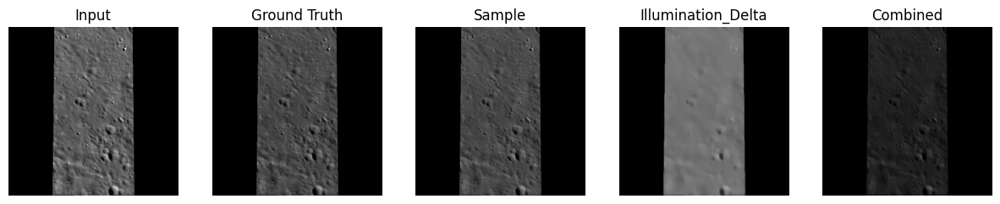

[*] Saving model RetinexNet-Relight
Relight Epoch: [12] [ 118/ 118] time: 2.4417, loss: 0.013105
[*] Evaluating for phase Relight / epoch 12...


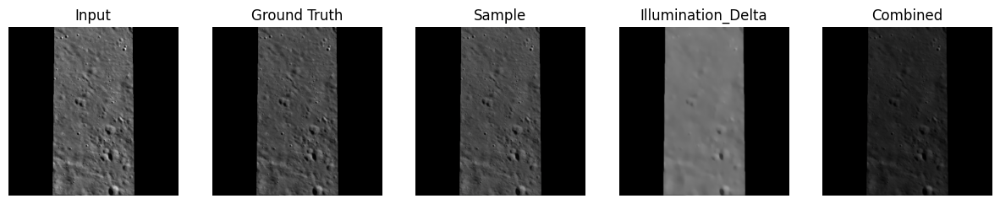

[*] Saving model RetinexNet-Relight
Relight Epoch: [13] [ 118/ 118] time: 2.4299, loss: 0.014294
[*] Evaluating for phase Relight / epoch 13...


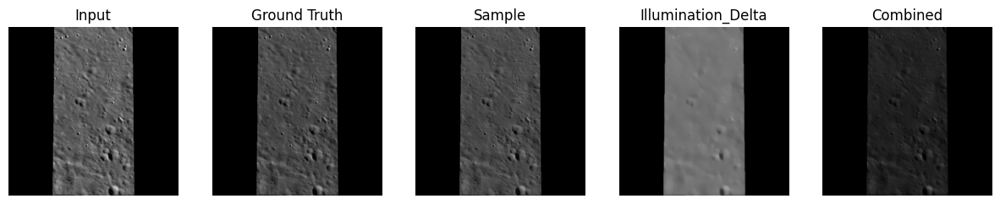

[*] Saving model RetinexNet-Relight
Relight Epoch: [14] [ 118/ 118] time: 2.4664, loss: 0.011891
[*] Evaluating for phase Relight / epoch 14...


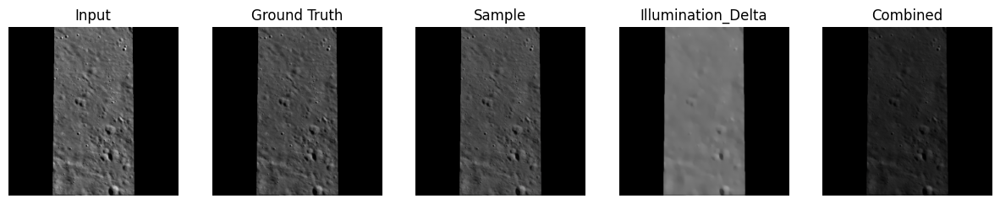

[*] Saving model RetinexNet-Relight
Relight Epoch: [15] [ 118/ 118] time: 2.3941, loss: 0.012437
[*] Evaluating for phase Relight / epoch 15...


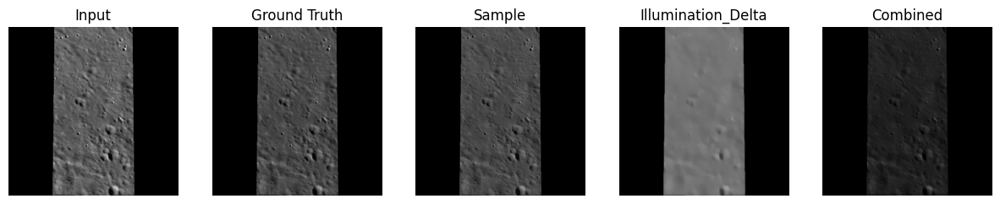

[*] Saving model RetinexNet-Relight
Relight Epoch: [16] [ 118/ 118] time: 2.4238, loss: 0.014677
[*] Evaluating for phase Relight / epoch 16...


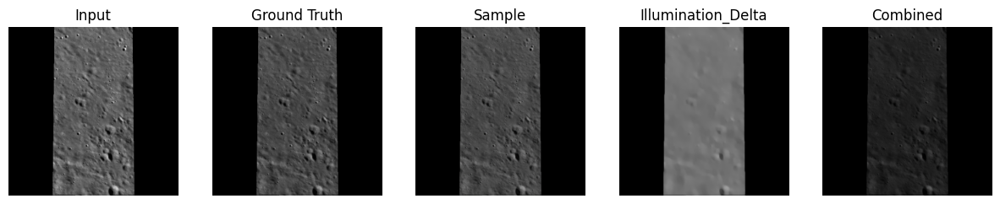

[*] Saving model RetinexNet-Relight
Relight Epoch: [17] [ 118/ 118] time: 2.4036, loss: 0.012573
[*] Evaluating for phase Relight / epoch 17...


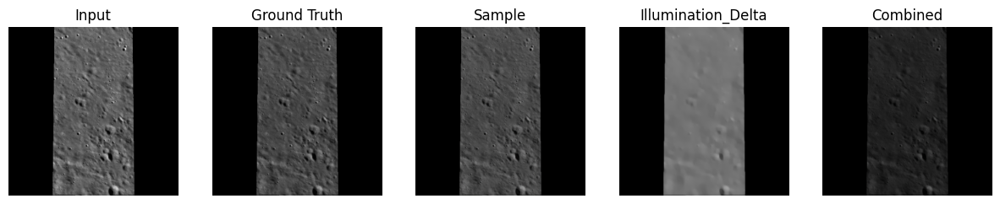

[*] Saving model RetinexNet-Relight
Relight Epoch: [18] [ 118/ 118] time: 2.4009, loss: 0.010901
[*] Evaluating for phase Relight / epoch 18...


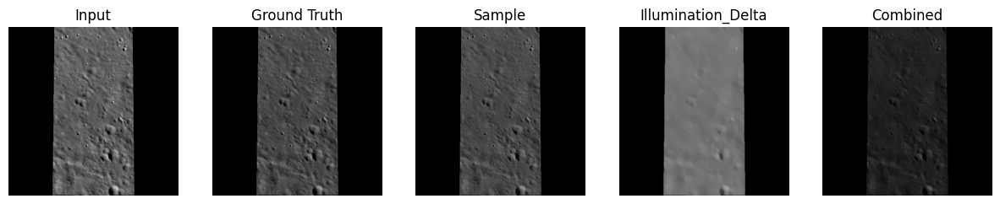

[*] Saving model RetinexNet-Relight
Relight Epoch: [19] [ 118/ 118] time: 2.4201, loss: 0.011570
[*] Evaluating for phase Relight / epoch 19...


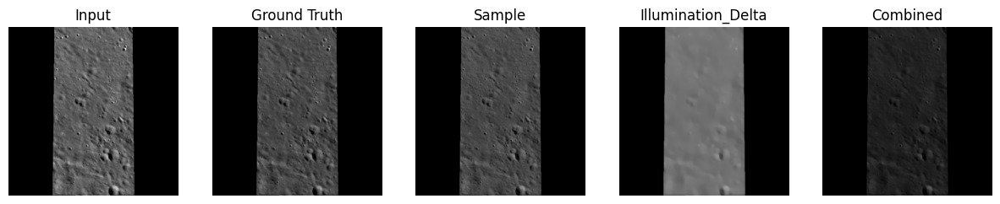

[*] Saving model RetinexNet-Relight
Relight Epoch: [20] [ 118/ 118] time: 2.4244, loss: 0.010485
[*] Evaluating for phase Relight / epoch 20...


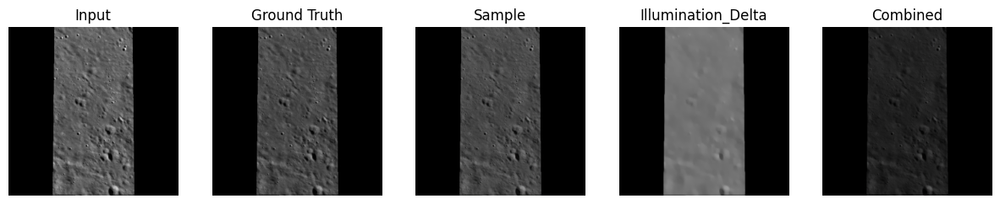

[*] Saving model RetinexNet-Relight
Relight Epoch: [21] [ 118/ 118] time: 2.4208, loss: 0.010401
[*] Evaluating for phase Relight / epoch 21...


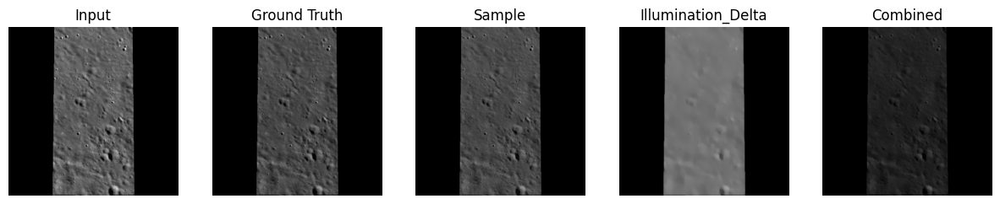

[*] Saving model RetinexNet-Relight
Relight Epoch: [22] [ 118/ 118] time: 2.4401, loss: 0.011736
[*] Evaluating for phase Relight / epoch 22...


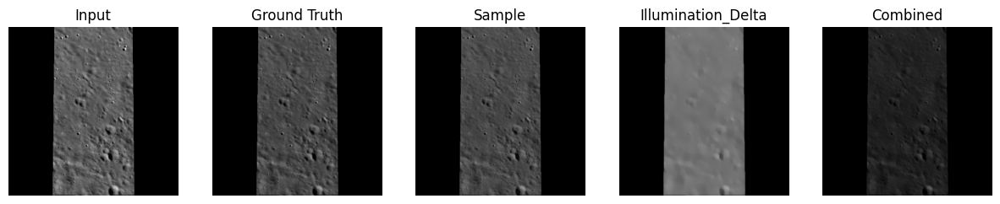

[*] Saving model RetinexNet-Relight
Relight Epoch: [23] [ 118/ 118] time: 2.7356, loss: 0.008721
[*] Evaluating for phase Relight / epoch 23...


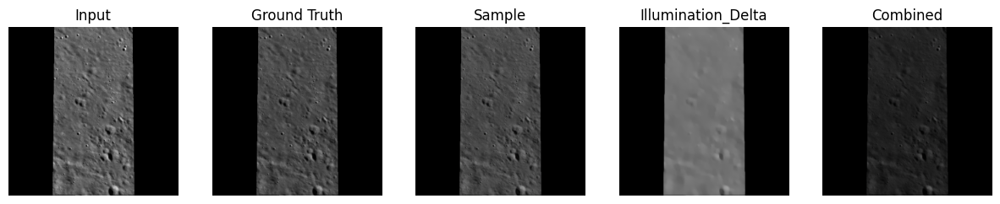

[*] Saving model RetinexNet-Relight
Relight Epoch: [24] [ 118/ 118] time: 2.4589, loss: 0.010538
[*] Evaluating for phase Relight / epoch 24...


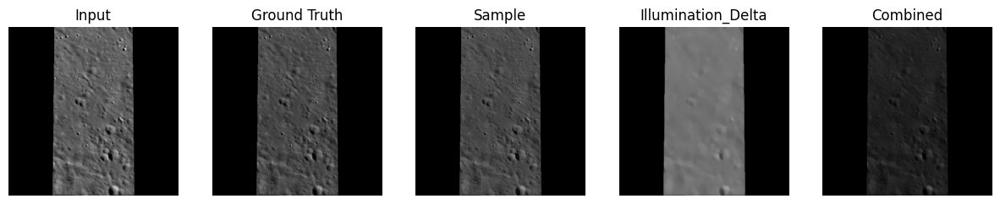

[*] Saving model RetinexNet-Relight
Relight Epoch: [25] [ 118/ 118] time: 2.4055, loss: 0.012105
[*] Evaluating for phase Relight / epoch 25...


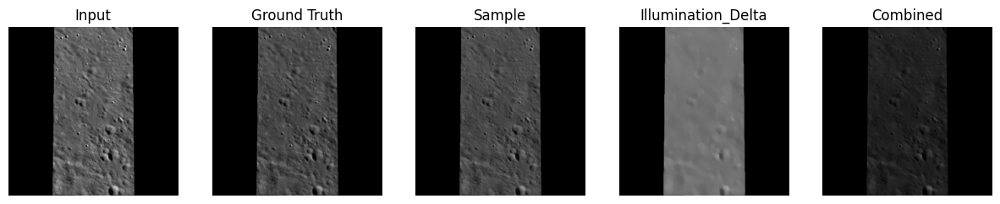

[*] Saving model RetinexNet-Relight
Relight Epoch: [26] [ 118/ 118] time: 2.3854, loss: 0.009476
[*] Evaluating for phase Relight / epoch 26...


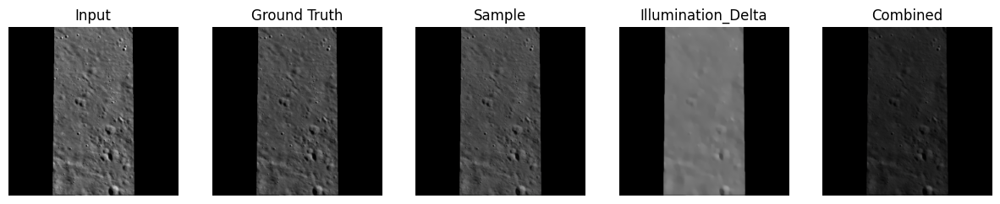

[*] Saving model RetinexNet-Relight
Relight Epoch: [27] [ 118/ 118] time: 2.3876, loss: 0.010076
[*] Evaluating for phase Relight / epoch 27...


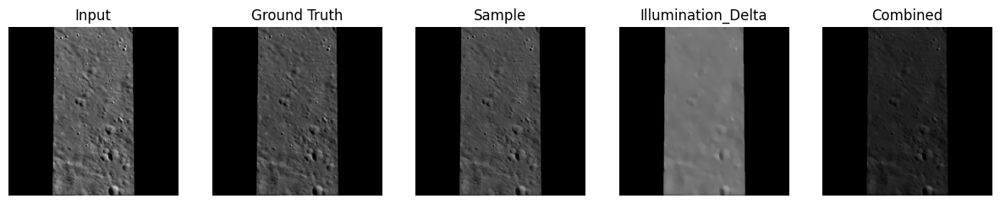

[*] Saving model RetinexNet-Relight
Relight Epoch: [28] [ 118/ 118] time: 2.3971, loss: 0.014991
[*] Evaluating for phase Relight / epoch 28...


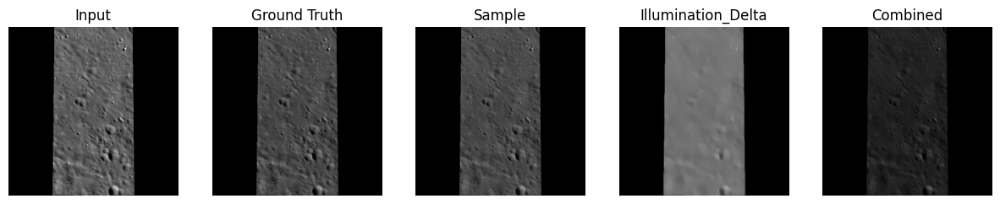

[*] Saving model RetinexNet-Relight
Relight Epoch: [29] [ 118/ 118] time: 2.4196, loss: 0.010319
[*] Evaluating for phase Relight / epoch 29...


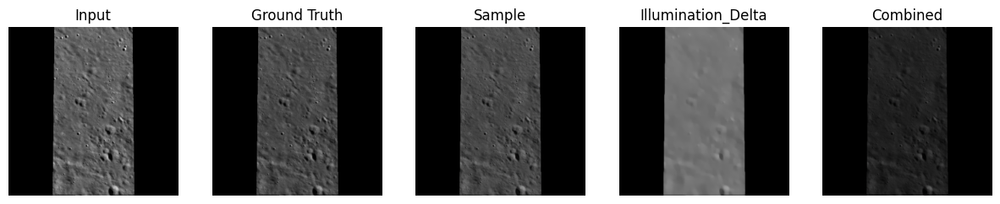

[*] Saving model RetinexNet-Relight
Relight Epoch: [30] [ 118/ 118] time: 2.4159, loss: 0.009932
[*] Evaluating for phase Relight / epoch 30...


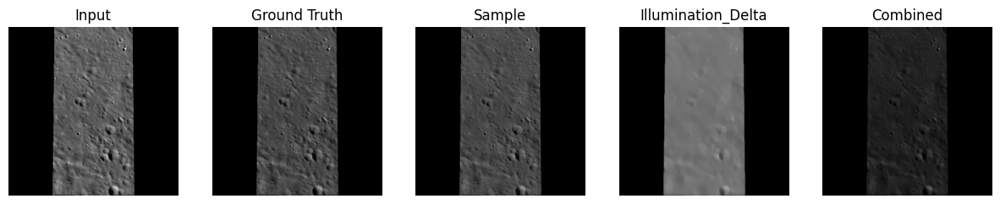

[*] Saving model RetinexNet-Relight
[*] Finish training for phase Relight in time 96.6654.


In [13]:
tf.reset_default_graph()

gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=1)
with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
    model = lowlight_enhance(sess)
    lowlight_train(model)

### Model Test

In [21]:
def lowlight_test(lowlight_enhance):
    if not os.path.exists(save_test_path):
        os.makedirs(save_test_path)

    test_low_data_name = glob(os.path.join(test_path) + '/Kaggle-8000-Original-Darkened-Grained/images/*.*')
    test_high_data_name = glob(os.path.join(test_path) + '/Kaggle-8000-Original/images/*.*')
    test_low_data = []
    test_high_data = []
  
    for idx in range(10):
        test_low_im = load_images(test_low_data_name[idx])
        test_low_data.append(test_low_im)
    
    for idx in range(10):
        test_high_im = load_images(test_high_data_name[idx])
        test_high_data.append(test_high_im)

    lowlight_enhance.test(test_low_data, test_high_data, test_low_data_name, save_dir=save_test_path, decom_flag=decom)

/tmp/ipykernel_2291/1021350135.py:5: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(input_im, channel, kernel_size * 3, padding='same', activation=None, name="shallow_feature_extraction")
/tmp/ipykernel_2291/1021350135.py:7: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(conv, channel, kernel_size, padding='same', activation=tf.nn.relu, name=f'activated_layer_{idx}')
/tmp/ipykernel_2291/1021350135.py:8: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `tf.keras.layers.Conv2D` instead.
  conv = tf.layers.conv2d(conv, 4, kernel_size, padding='same', activation=None, name='recon_layer')
/tmp/ipykernel_2291/1021350135.py:18: UserWarning: `tf.layers.conv2d` is deprecated and will be removed in a future version. Please Use `t

[*] Initialize model successfully...
[*] Reading checkpoint...
[*] Load weights successfully...
[*] Testing...
/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/-166.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-166_R_low.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-166_I_low.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-166_I_delta.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-166_S.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-166_Result.28119160162683,-164.90931076178953,39.24040892601955,40.61228976585686.png


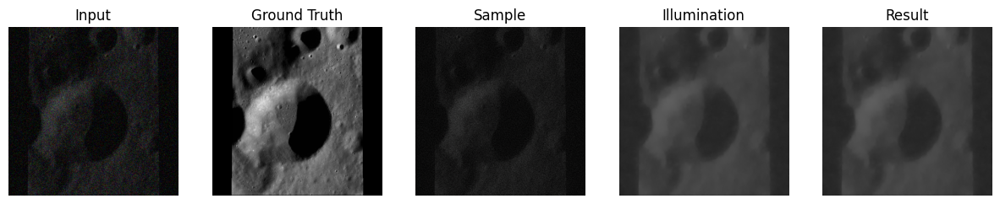

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/132.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png
[*] Saved at /kaggle/working/Model/Model_Data/save/132_R_low.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png
[*] Saved at /kaggle/working/Model/Model_Data/save/132_I_low.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png
[*] Saved at /kaggle/working/Model/Model_Data/save/132_I_delta.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png
[*] Saved at /kaggle/working/Model/Model_Data/save/132_S.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png
[*] Saved at /kaggle/working/Model/Model_Data/save/132_Result.78883148290637,134.16071232274365,10.430911289436077,11.802792129273378.png


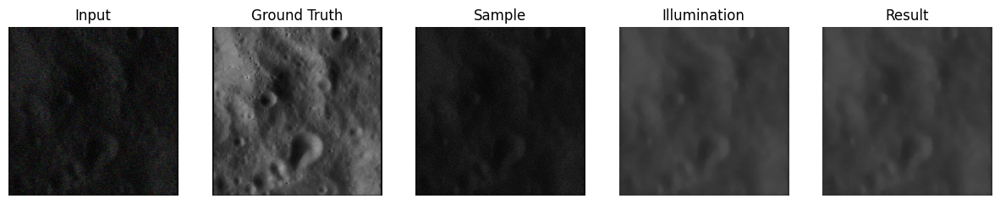

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/-60.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-60_R_low.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-60_I_low.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-60_I_delta.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-60_S.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-60_Result.64636693415408,-59.274486094316764,-44.44432230405624,-43.07244146421894.png


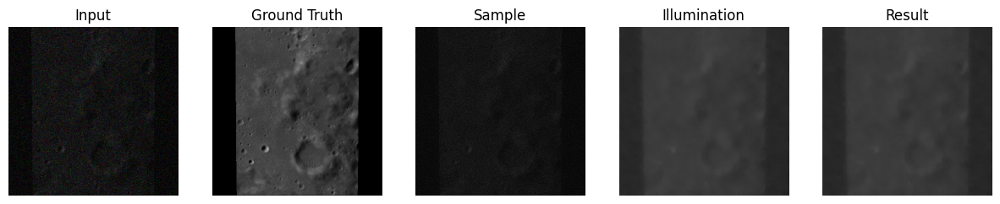

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/-179.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-179_R_low.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-179_I_low.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-179_I_delta.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-179_S.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-179_Result.99999999999991,-178.6281191601626,-49.93184566340548,-48.55996482356818.png


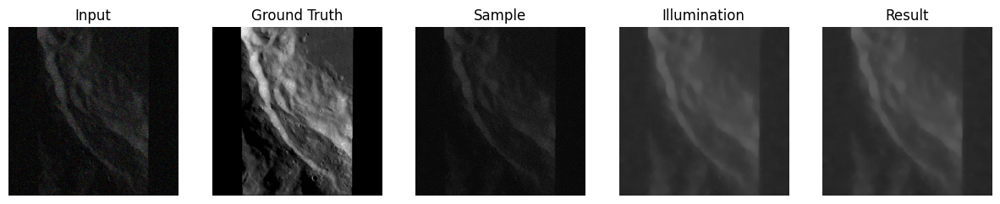

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/-125.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-125_R_low.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-125_I_low.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-125_I_delta.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-125_S.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-125_Result.12476640650756,-123.75288556667027,31.00912388699569,32.381004726833.png


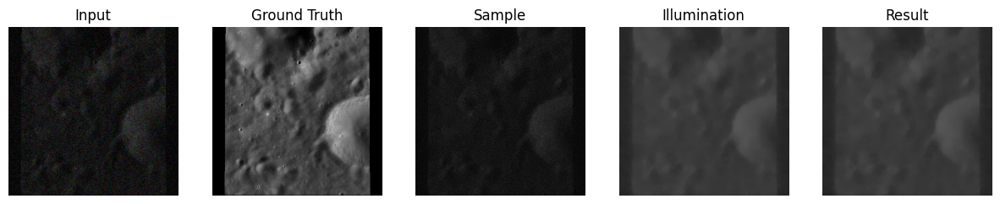

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/86.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png
[*] Saved at /kaggle/working/Model/Model_Data/save/86_R_low.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png
[*] Saved at /kaggle/working/Model/Model_Data/save/86_I_low.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png
[*] Saved at /kaggle/working/Model/Model_Data/save/86_I_delta.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png
[*] Saved at /kaggle/working/Model/Model_Data/save/86_S.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png
[*] Saved at /kaggle/working/Model/Model_Data/save/86_Result.14488292843788,87.51676376827521,0.8277454105749196,2.1996262504122215.png


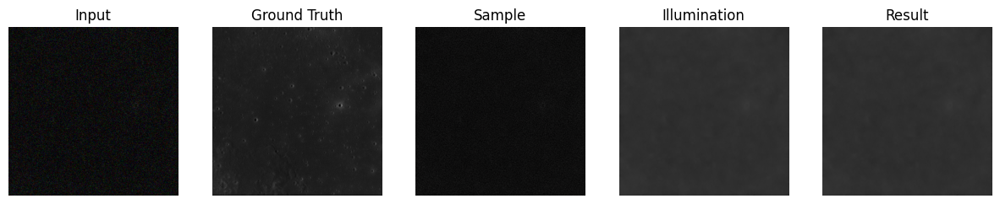

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/-152.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-152_R_low.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-152_I_low.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-152_I_delta.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-152_S.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png
[*] Saved at /kaggle/working/Model/Model_Data/save/-152_Result.56238320325375,-151.1905023634164,35.12476640650762,36.49664724634492.png


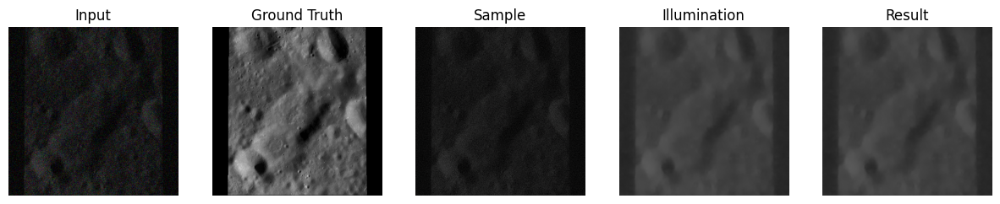

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/177.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png
[*] Saved at /kaggle/working/Model/Model_Data/save/177_R_low.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png
[*] Saved at /kaggle/working/Model/Model_Data/save/177_I_low.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png
[*] Saved at /kaggle/working/Model/Model_Data/save/177_I_delta.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png
[*] Saved at /kaggle/working/Model/Model_Data/save/177_S.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png
[*] Saved at /kaggle/working/Model/Model_Data/save/177_Result.25623832032522,178.62811916016264,-71.88193910080243,-70.51005826096511.png


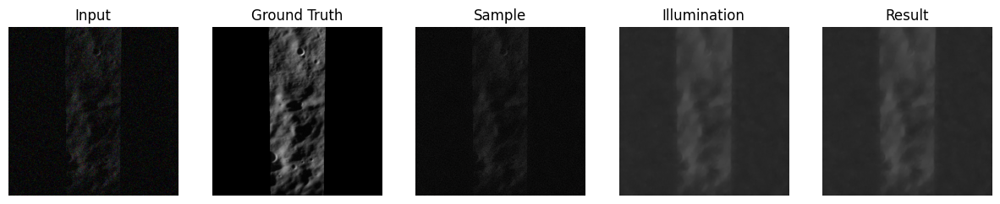

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/106.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png
[*] Saved at /kaggle/working/Model/Model_Data/save/106_R_low.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png
[*] Saved at /kaggle/working/Model/Model_Data/save/106_I_low.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png
[*] Saved at /kaggle/working/Model/Model_Data/save/106_I_delta.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png
[*] Saved at /kaggle/working/Model/Model_Data/save/106_S.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png
[*] Saved at /kaggle/working/Model/Model_Data/save/106_Result.72309552599758,108.09497636583484,-22.494228866659327,-21.122348026822014.png


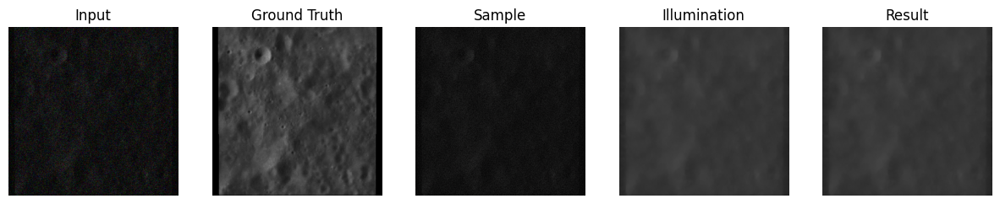

/kaggle/input/sih-tamohar/SIH -- Kaggle -- Samyak/Kaggle-8000-Original-Darkened-Grained/images/143.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png
[*] Saved at /kaggle/working/Model/Model_Data/save/143_R_low.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png
[*] Saved at /kaggle/working/Model/Model_Data/save/143_I_low.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png
[*] Saved at /kaggle/working/Model/Model_Data/save/143_I_delta.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png
[*] Saved at /kaggle/working/Model/Model_Data/save/143_S.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png
[*] Saved at /kaggle/working/Model/Model_Data/save/143_Result.76387820160485,145.13575904144216,-0.5441354292623967,0.8277454105749196.png


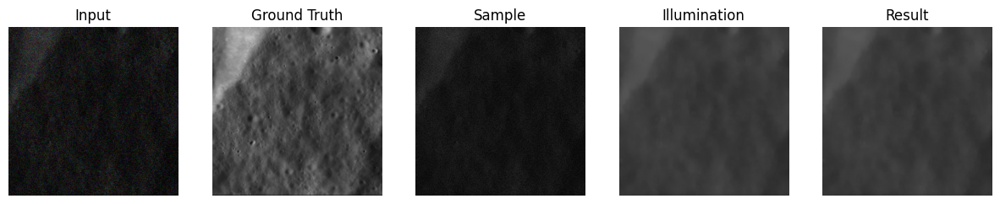

In [22]:
tf.reset_default_graph()

gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=1)
with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
    model = lowlight_enhance(sess)
    lowlight_test(model)